<a href="https://colab.research.google.com/github/poleErection/potential-eureka/blob/master/Notebook/Retail_analytics.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
####Importing all the packages as necessary
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from datetime import datetime
from scipy.stats.mstats import winsorize
%matplotlib inline

import plotly
from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
print(__version__) # requires version >= 1.9.0
import plotly.graph_objects as go
import cufflinks as cf
cf.go_offline()

def enable_plotly_in_cell():
  import IPython
  from plotly.offline import init_notebook_mode
  display(IPython.core.display.HTML('''<script src="/static/components/requirejs/require.js"></script>'''))
  init_notebook_mode(connected=False)

5.24.1


In [2]:
########Uploading the necessary files - Customer, Product category and Transactions
from google.colab import files
upload =files.upload()
upload =files.upload()
upload =files.upload()

Saving Customer.csv to Customer.csv


Saving prod_cat_info.csv to prod_cat_info.csv


Saving Transactions.csv to Transactions.csv


In [3]:
##############Reading the files from the stored data#######
customer=pd.read_csv('Customer.csv')
prod_cat=pd.read_csv('prod_cat_info.csv')
transaction=pd.read_csv('Transactions.csv')
transaction=transaction.drop_duplicates()
transaction=transaction[transaction['Qty']>0]  ###Removing the negative quantity from the data as it is junk
len(transaction)
transaction.head()

,transaction_id,cust_id,tran_date,prod_subcat_code,prod_cat_code,Qty,Rate,Tax,total_amt,Store_type
10,29258453508,270384,20-02-2014,5,3,5,1497,785.925,8270.925,e-Shop
11,25455265351,267750,20-02-2014,12,6,3,1360,428.400,4508.400,e-Shop
12,1571002198,275023,20-02-2014,6,5,4,587,246.540,2594.540,e-Shop
14,36554696014,269345,20-02-2014,3,5,3,1253,394.695,4153.695,e-Shop
15,56814940239,268799,20-02-2014,7,5,5,368,193.200,2033.200,e-Shop


In [5]:
##Changing the data column into date format
transaction['Date']=pd.to_datetime(transaction['Date'], format='%m/%d/%Y')
transaction['year']=pd.DatetimeIndex(transaction['Date']).year.astype('str')
transaction['Concat']=transaction['Concat'].astype('str')  #using an alternate date for plotting graphs
len(transaction['Concat'].unique())
transaction.columns

KeyError: 'Date'

<b>Exploratory Data Analysis

In [ ]:
####Merging all the datasets to form the master table
df=pd.merge(transaction,customer,how='inner',left_on='cust_id',right_on='customer_Id')
master_df=pd.merge(df,prod_cat,how='left',left_on=['prod_cat_code','prod_subcat_code'],right_on=['prod_cat_code' ,'prod_sub_cat_code'])
master_df['Concat']=master_df['Concat'].astype('str')

KeyError: 'Concat'

In [ ]:
master_df.head()

,transaction_id,cust_id,tran_date,prod_subcat_code,prod_cat_code,Qty,Rate,Tax,total_amt,Store_type,customer_Id,DOB,Gender,city_code,prod_cat,prod_sub_cat_code,prod_subcat
0,29258453508,270384,20-02-2014,5,3,5,1497,785.925,8270.925,e-Shop,270384,11-05-1973,F,8.0,Electronics,5,Computers
1,25455265351,267750,20-02-2014,12,6,3,1360,428.400,4508.400,e-Shop,267750,13-10-1986,M,1.0,Home and kitchen,12,Tools
2,1571002198,275023,20-02-2014,6,5,4,587,246.540,2594.540,e-Shop,275023,09-03-1971,M,6.0,Books,6,DIY
3,36554696014,269345,20-02-2014,3,5,3,1253,394.695,4153.695,e-Shop,269345,26-06-1970,F,10.0,Books,3,Comics
4,56814940239,268799,20-02-2014,7,5,5,368,193.200,2033.200,e-Shop,268799,27-06-1979,M,9.0,Books,7,Fiction


<b>Now we have the master df which contains all the information so we can move ahead with the exploratory data analysis

In [ ]:
# Checking for null values in the dataframe
len(master_df.isnull().values[master_df.isnull().values==True])
print(f'There are only {len(master_df.isnull().values[master_df.isnull().values==True])} missing values in the dataset')
print('We can also visualize the percentage of missing values this via missing map')

There are only 16 missing values in the dataset
We can also visualize the percentage of missing values this via missing map


In [ ]:
#######Total NULL values
master_df.isnull().sum()

transaction_id       0
cust_id              0
tran_date            0
Date                 0
Concat               0
prod_subcat_code     0
prod_cat_code        0
Qty                  0
Rate                 0
Tax                  0
total_amt            0
Store_type           0
Week                 0
Year                 0
Week_no              0
year                 0
customer_Id          0
DOB_old              0
DOB                  0
Gender               8
city_code            8
prod_cat             0
prod_sub_cat_code    0
prod_subcat          0
dtype: int64

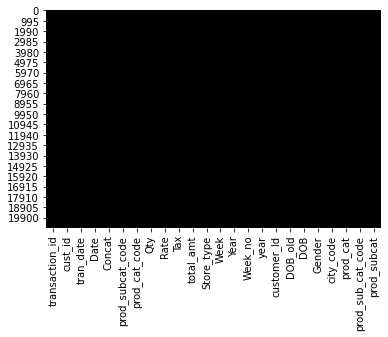

In [ ]:
sns.heatmap(master_df.isnull(), cbar=False,cmap=['black','yellow'])
##where the yellow color represent the missing values and the black is where there are some values
##As wecan see they negligible missing values in the dataset and thus can be ignored
master_df.dropna(inplace=True)

In [ ]:
master_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 20860 entries, 0 to 20875
Data columns (total 24 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   transaction_id     20860 non-null  int64         
 1   cust_id            20860 non-null  int64         
 2   tran_date          20860 non-null  object        
 3   Date               20860 non-null  datetime64[ns]
 4   Concat             20860 non-null  object        
 5   prod_subcat_code   20860 non-null  int64         
 6   prod_cat_code      20860 non-null  int64         
 7   Qty                20860 non-null  int64         
 8   Rate               20860 non-null  int64         
 9   Tax                20860 non-null  float64       
 10  total_amt          20860 non-null  float64       
 11  Store_type         20860 non-null  object        
 12  Week               20860 non-null  int64         
 13  Year               20860 non-null  int64         
 14  Week_n

In [ ]:
##Creating two additional columns for date##
master_df['Day of Week'] =master_df['Date'].dt.day_name()
master_df['Month'] =master_df['Date'].dt.month

<b> Time series trends </b>

<b> Monthly sales Across Time <b>

Text(0.5, 1.0, 'Distribution of Sales Across Months')

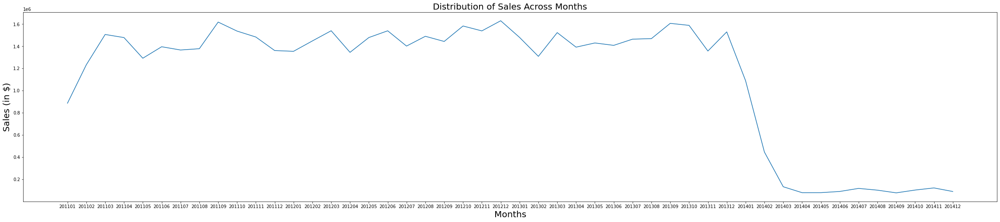

In [ ]:
monthly_df=master_df.groupby(['Concat'])['total_amt'].sum().to_frame().reset_index()
fig, ax = plt.subplots()
fig.set_size_inches(40, 8)
plt.plot('Concat','total_amt',data=monthly_df)
sns.set_style("dark")
plt.xlabel('Months',fontsize=20)
plt.ylabel('Sales (in $)',fontsize=20)
plt.title('Distribution of Sales Across Months',fontsize=20)

<b>Monthly sales per store type across time<b>

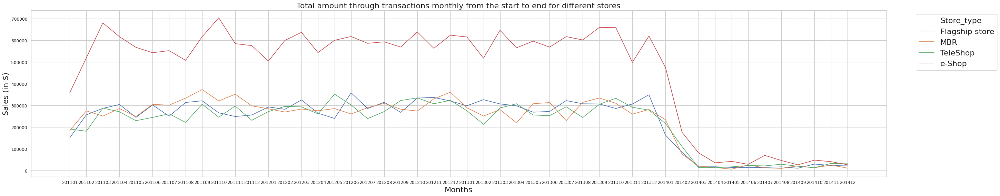

In [ ]:
plt.figure(num=None, figsize=(40, 8), dpi=80, facecolor='w', edgecolor='k')
sns.set(style="whitegrid")
fig.set_size_inches(40, 8)
monthlystore_df=master_df.groupby(['Store_type','Concat'])['total_amt'].sum().to_frame().reset_index()
sns.lineplot('Concat','total_amt',data=monthlystore_df,hue='Store_type')
plt.xlabel('Months',fontsize=20)
plt.ylabel('Sales (in $)',fontsize=20)
plt.title('Total amount through transactions monthly from the start to end for different stores',fontsize=20)
plt.legend(loc='upper left', bbox_to_anchor=(1.03, 1),fontsize=20)

It can be seen that total transactions for e-shop is much higher than the other three stores across time while the other three stores

<b> Monthly Analysis  order </b>

<b> Weekly Analysis </b>

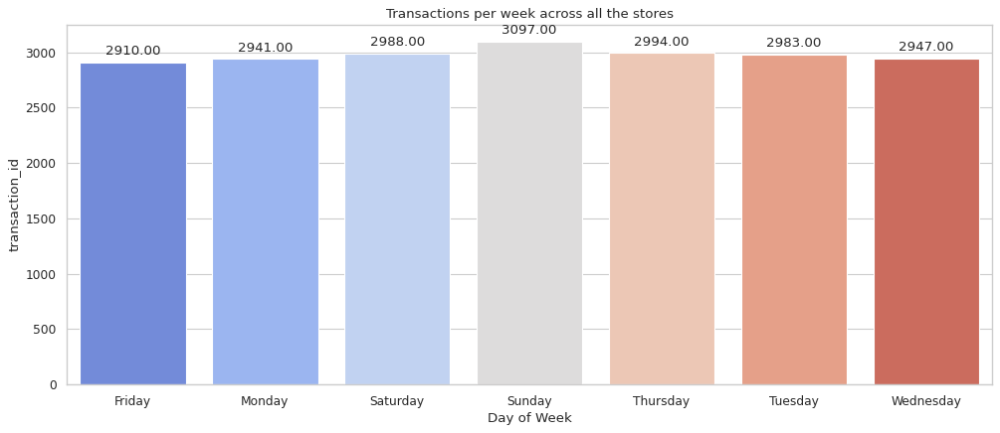

In [ ]:
plt.figure(num=None, figsize=(15, 6), dpi=80, facecolor='w', edgecolor='k')
sns.set(style="whitegrid")
grouped_values=master_df.groupby(['Day of Week']).count().reset_index()
g=sns.barplot(x='Day of Week',y='transaction_id',data=grouped_values,palette='coolwarm')

plt.title('Transactions per week across all the stores')
for p in g.patches:
  g.annotate(format(p.get_height(), '.2f'), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')

There is negligible difference between the number of orders per day of the week and almost identical number of orders are sold on each day of the week

Teleshop -to buy goods by telephone or via the internet.

A flagship store is the most important store in a chain, often with the largest volume of sales, or the most up-to-date formats or layouts. It is usual that the opening of a flagship store marks the first development of a retail store portfolio within a luxury fashion retailer's most important foreign markets.

An e-shop is an online business that sells a variety of goods and services. E-shops are business-to-consumer oriented. They are just like a retail store but instead of having a physical location, its location is on the internet

The term "brick-and-mortar" refers to a traditional street-side business that offers products and services to its customers face-to-face in an office or store that the business owns or rents. The local grocery store and the corner bank are examples of brick-and-mortar companies


As seen through the time series data for eachstore E-shop should produce a higher transaction amount as compared to the other three stores ,
lets plot a bar graph to see that

Text(0.5, 1.0, 'Total unique transactions for different Store Types')

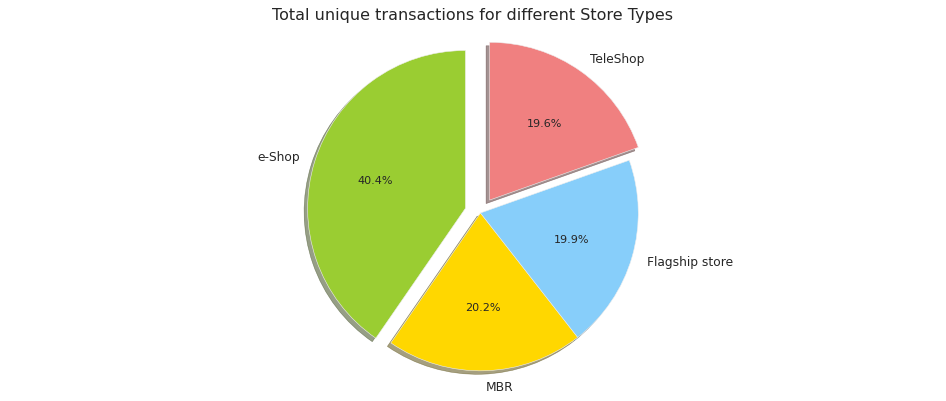

In [ ]:
plt.figure(num=None, figsize=(15, 6), dpi=80, facecolor='w', edgecolor='k')
plt.style.use('ggplot')
labels = master_df['Store_type'].value_counts().index
sizes = master_df['Store_type'].value_counts().values
explode = (0.1, 0.0, 0.0, 0.1)  # only "explode" the 2nd and 3rd slices (i.e. 'Hogs')
colors = ['yellowgreen', 'gold', 'lightskyblue', 'lightcoral']
plt.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=90 ,colors=colors)
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.title("Total unique transactions for different Store Types")

We can see that more than <b> 60% </b> of the transactions are for e-shop and Teleshops which indicated the shift in the mindset of people earlier this decade as this was the time when big giants such as Amazon and other E-commerce websites

As we can see that total amount of transactions for E-shop is approximately twice as compared to the other store types

<b> Product Categories </b>

Text(0.5, 1.0, 'Total unique transactions for different product categories')

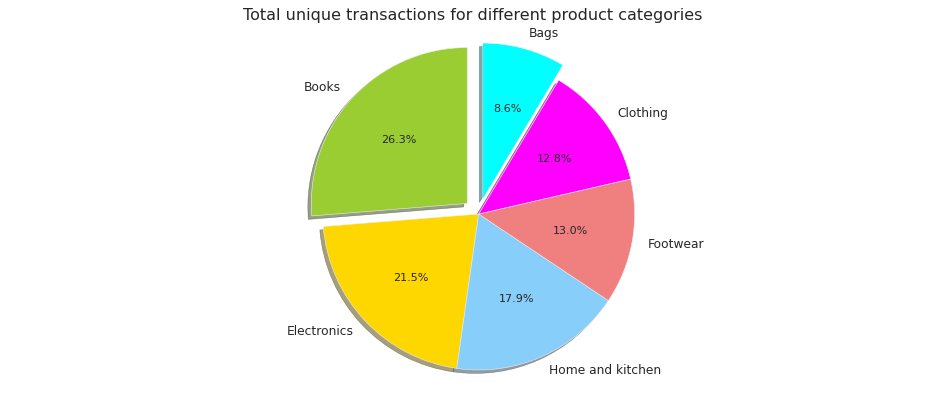

In [ ]:
plt.figure(num=None, figsize=(15, 6), dpi=80, facecolor='w', edgecolor='k')
plt.style.use('ggplot')
labels = master_df['prod_cat'].value_counts().index
sizes = master_df['prod_cat'].value_counts().values
explode = (0.1, 0.0, 0.0, 0.0,0.0,0.1)  # only "explode" the 2nd and 3rd slices (i.e. 'Hogs')
colors = ['yellowgreen', 'gold', 'lightskyblue', 'lightcoral','magenta','cyan']
plt.pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%',
        shadow=True, startangle=90 ,colors=colors)
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.title("Total unique transactions for different product categories")

Books have the highest number of transactions and the second one is electronics , the lowest is bags

In [4]:
# master_df.rename(columns={'product_category':'product category', 'total_amt': 'Total sales amount'},inplace=True)
########Purchase behavior by category, age and gender
plt.figure(figsize=(30,10))
sns.set(style="whitegrid")
df2=master_df.groupby(['prod_cat','Age_group','Gender']).sum()['total_amt'].reset_index()
df2.rename(columns={'prod_cat':'product category','total_amt':'Total sales amount'},inplace=True)
g=sns.catplot(x="product category", y="Total sales amount",hue="Age_group", col="Gender",data=df2, kind="bar")
g.set_xticklabels(rotation=30)


NameError: name 'master_df' is not defined

<Figure size 3000x1000 with 0 Axes>

Text(0, 0.5, 'Sales (in $)')

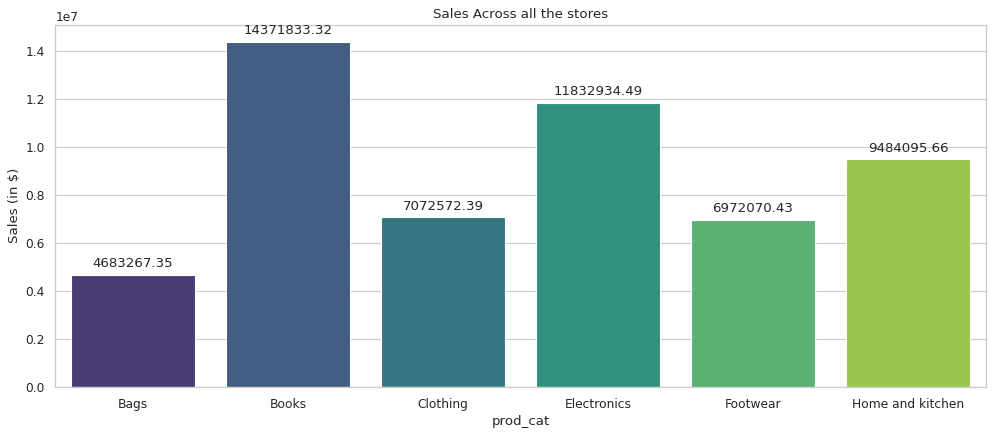

In [ ]:
plt.figure(num=None, figsize=(15, 6), dpi=80, facecolor='w', edgecolor='k')
sns.set(style="whitegrid")
df2=master_df.groupby(['prod_cat']).sum()['total_amt'].reset_index()
g=sns.barplot(x='prod_cat',y='total_amt',data=df2,palette='viridis')
plt.title('Sales Across all the stores')
for p in g.patches:
  g.annotate(format(p.get_height(), '.2f'), (p.get_x() + p.get_width() / 2., p.get_height()), ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')
plt.ylabel("Sales (in $)")

An interesting thing to note here is that Books were responsible for the maximum transaction amount even higher than electronics and the lowest conribution is acoounted by bags.

From the above analysis for both the store types and product categories we can see that the number of unique transactions are positevely correlated to the amount of transaction produced , which is kind of expected

<b>Distribution of transactions amounts

In [ ]:
enable_plotly_in_cell()
master_df['total_amt'].iplot(kind='hist',bins=25)

<b> Correlation plot </b>

<b>Gender and age analyisis<b>

In [ ]:
# master_df['DOB'] = master_df['DOB'].apply(lambda x: datetime.strptime(x, '%d-%m-%Y') if '-' in x else datetime.strptime(x, '%d/%m/%Y'))
master_df['DOB'] = pd.to_datetime(master_df['DOB'], format = '%m/%d/%Y')
master_df['Age']=master_df['Date']-master_df['DOB']
master_df['Age']=master_df['Age'].apply(lambda x:round(int(str(x).split()[0])/365,0))
master_df['Age_group']=master_df['Age'].apply(lambda x: 'Young' if (18<=x<=25) else ('Middle' if (25<x<=35) else 'Old'))

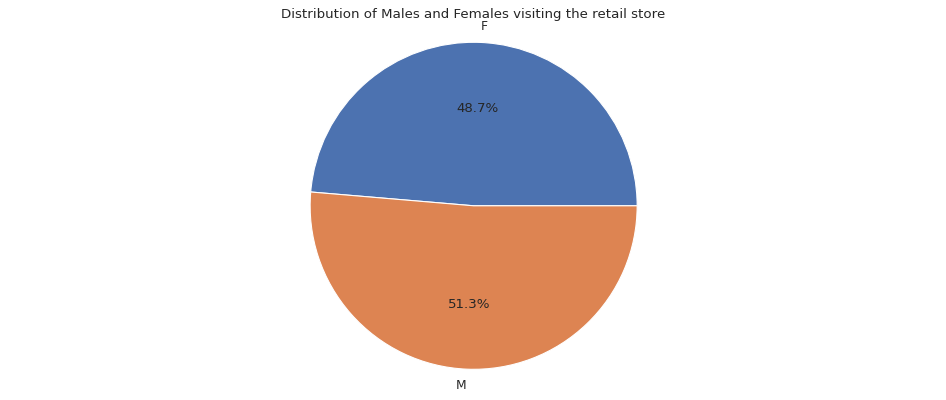

In [ ]:
plt.figure(num=None, figsize=(15, 6), dpi=80, facecolor='w', edgecolor='k')
Gender_count=master_df.groupby(['Gender'])['customer_Id'].nunique().to_frame().reset_index()

plt.pie(Gender_count['customer_Id'],labels=Gender_count['Gender'],autopct='%1.1f%%')
plt.title("Distribution of Males and Females visiting the retail store")
plt.axis('equal')
plt.show()

There are more male customers then female customers but the ratio is not different

In [ ]:
#####Removing the 2014 data due to its discrepancy
master_df_sub=master_df[master_df['Date']<='2013-12-31']

<b>Problem1 - Customer Segmentation

In [ ]:
######Clustering approach
df3_clustering=master_df_sub.groupby('cust_id').agg({'total_amt':'sum','Qty':'sum','transaction_id':'nunique','Age':'mean'}).reset_index()
df3_clustering['Sales/Trans']=df3_clustering['total_amt']/df3_clustering['transaction_id']
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
# scaler.fit(df3_clustering[["Sales/Trans","Qty","Age"]])
# x=scaler.transform(df3_clustering[["Sales/Trans","Qty","transaction_id"]])
x=scaler.fit_transform(df3_clustering[["Sales/Trans","Qty","transaction_id"]])  ###Scaling all variables to treat all the importance equally
x=pd.DataFrame(x)
cluster_results=x
x

,0,1,2
0,0.261301,0.243243,0.3
1,0.219763,0.243243,0.2
2,0.484164,0.729730,0.6
3,0.173998,0.189189,0.3
4,0.322656,0.756757,0.9
...,...,...,...
5464,0.406996,0.297297,0.3
5465,0.138803,0.216216,0.2
5466,0.298070,0.108108,0.1
5467,0.220955,0.216216,0.1


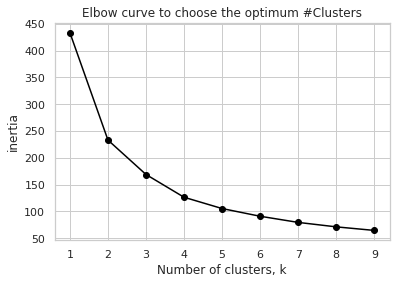

In [ ]:
from sklearn.cluster import KMeans
# Empty list to store Sum of squared distances of samples to their closest cluster centre
inertias = []
for k in range(1,10):
    # Create a KMeans instance with k clusters: model
    model = KMeans(n_clusters=k)
    # Fit model to samples
    #model.fit(pca_1.iloc[:,:3])
    model.fit(cluster_results)
    # Append the inertia to the list of inertias
    inertias.append(model.inertia_)
plt.plot(range(1,10), inertias, '-o', color='black')
plt.xlabel('Number of clusters, k')
plt.ylabel('inertia')
plt.title('Elbow curve to choose the optimum #Clusters')
plt.xticks(range(1,10))
plt.show()

In [ ]:
###Fitting the algorithm to the data
kmeans = KMeans(n_clusters=3, init='k-means++', max_iter=300, n_init=10, random_state=0)
pred_y = kmeans.fit_predict(cluster_results)
pred_y=pd.DataFrame(pred_y,columns=['Cluster'])
df3_clustering1 = pd.concat([df3_clustering,pred_y], axis=1)
# df3_clustering1=pd.merge(master_df,df3_clustering1,left_on='customer_Id',right_on='cust_id',how='left')
kmeans.cluster_centers_

array([[0.31111579, 0.4521057 , 0.47238151],
       [0.45973727, 0.23684302, 0.18153153],
       [0.19253984, 0.14834236, 0.1605621 ]])

In [ ]:
############Saving the results in a file###################
df3_clustering1.to_excel("cluster_results2.xlsx")

In [ ]:
#######3D package imported######
from mpl_toolkits.mplot3d import Axes3D

In [ ]:
# fig = plt.figure(figsize=(15,8))
# ax = fig.add_subplot(111, projection='3d')
# x=['yellowgreen', 'gold', 'lightskyblue']
# for i,num in enumerate(x):
#   plt.scatter(df3_clustering1[df3_clustering1["Cluster"]==i]["total_amt_x"],df3_clustering1[df3_clustering1["Cluster"]==i]["Qty_x"],df3_clustering1[df3_clustering1["Cluster"]==i]["transaction_id_x"],label='Cluster'+str(i), c =num)
#   plt.legend(loc='upper left')
# ax.set_xlabel('Total Amount')
# ax.set_ylabel('Quantity')
# ax.set_zlabel('Number of Transactions')
# plt.legend(loc='upper left', bbox_to_anchor=(1.03, 1))
# plt.title('K-mean clustering for customer segementation : K=3')
# plt.tight_layout()

In [ ]:
df3_clustering1.head()

,cust_id,total_amt,Qty,transaction_id,Age,Sales/Trans,Cluster
0,266783,8952.710,10,4,39.000000,2238.177500,2
1,266784,5694.065,10,3,20.666667,1898.021667,2
2,266785,28442.700,28,7,27.000000,4063.242857,0
3,266788,6092.970,8,4,40.750000,1523.242500,2
4,266794,27406.210,29,10,40.900000,2740.621000,0


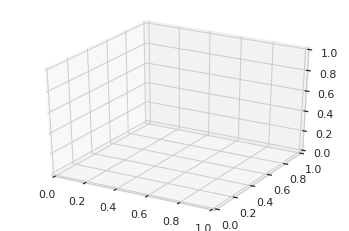

In [ ]:
from mpl_toolkits import mplot3d

import numpy as np
import matplotlib.pyplot as plt

fig = plt.figure()
ax = plt.axes(projection="3d")

plt.show()

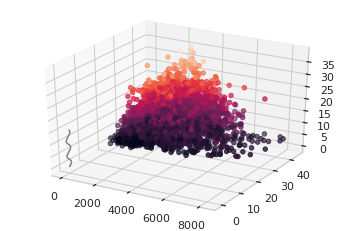

In [ ]:
fig = plt.figure()
ax = plt.axes(projection="3d")

z_line = np.linspace(0, 15, 1000)
x_line = np.cos(z_line)
y_line = np.sin(z_line)
ax.plot3D(x_line, y_line, z_line, 'gray')

z_points = df3_clustering1['Qty']
x_points = df3_clustering1['Sales/Trans']
y_points = df3_clustering1['Age']
ax.scatter3D(x_points, y_points, z_points, c=z_points);

plt.show()

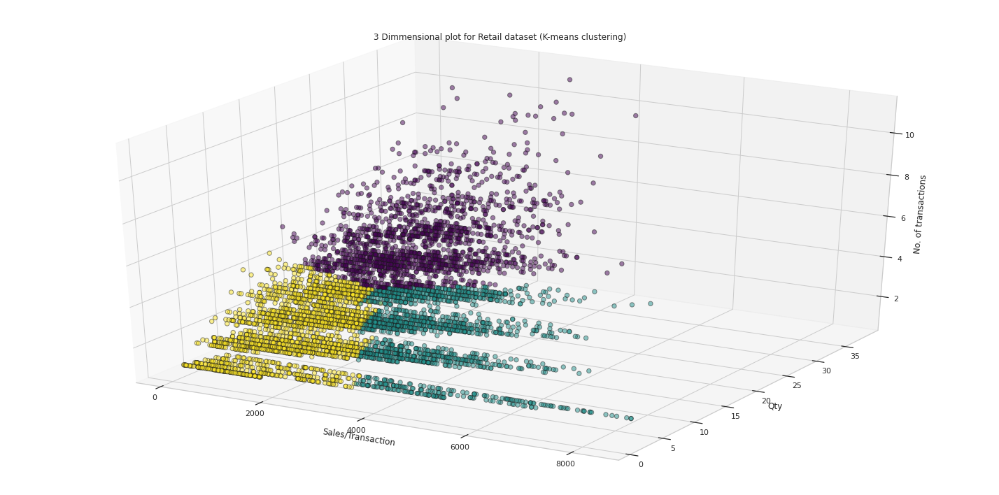

In [ ]:
##########3D view of the clusters############
fig = plt.figure(figsize=(20,10))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(df3_clustering1["Sales/Trans"],df3_clustering1["Qty"],df3_clustering1["transaction_id"],
            c=df3_clustering1['Cluster'], cmap='viridis',
            edgecolor='k', s=40, alpha = 0.5)
ax.set_xlabel('Sales/Transaction')
ax.set_ylabel('Qty')
ax.set_zlabel('No. of transactions')
ax.set_title('3 Dimmensional plot for Retail dataset (K-means clustering)')
plt.tight_layout()

In [ ]:
#######Interactive view to get cluster view - Rotate to get a better picture#######
enable_plotly_in_cell()
import plotly.express as px
df = df3_clustering1
df=df.rename(columns={'transaction_id': '#transactions'})
# df=df.rename(columns={'', 'Transactions'})
df.head()
fig = px.scatter_3d(df, x='Sales/Trans', y='Qty', z='#transactions',
             color='Cluster', opacity=0.2)

fig.show()

In [ ]:
# fig = plt.figure()
# ax = fig.add_subplot(111)
# scatter = ax.scatter(df3_clustering1["Sales/Trans"],df3_clustering1["total_amt"],
#                      c=df3_clustering1['Cluster'],s=50)
# ax.set_title('K-Means Clustering')
# ax.set_xlabel('GDP per Capita')
# ax.set_ylabel('Corruption')
# plt.colorbar(scatter)

<b>Problem2 - Sales Forecasting

In [ ]:
####code for forecasting###############################
master_df.head()

,transaction_id,cust_id,tran_date,Date,Concat,prod_subcat_code,prod_cat_code,Qty,Rate,Tax,total_amt,Store_type,Week,Year,Week_no,year,customer_Id,DOB_old,DOB,Gender,city_code,prod_cat,prod_sub_cat_code,prod_subcat,Day of Week,Month,Age,Age_group
0,29258453508,270384,20-02-2014,2014-02-20,201402,5,3,5,1497,785.925,8270.925,e-Shop,8,2014,201408,2014,270384,11/5/1973,1973-11-05,F,8.0,Electronics,5,Computers,Thursday,2,40.0,Old
1,92734514344,270384,26-10-2013,2013-10-26,201310,1,4,2,1362,286.020,3010.020,TeleShop,43,2013,201343,2013,270384,11/5/1973,1973-11-05,F,8.0,Bags,1,Mens,Saturday,10,40.0,Old
2,865952996,270384,6/8/2013,2013-06-08,201306,12,6,2,86,18.060,190.060,MBR,23,2013,201323,2013,270384,11/5/1973,1973-11-05,F,8.0,Home and kitchen,12,Tools,Saturday,6,40.0,Old
3,4116651679,270384,6/8/2013,2013-06-08,201306,6,5,1,1343,141.015,1484.015,TeleShop,23,2013,201323,2013,270384,11/5/1973,1973-11-05,F,8.0,Books,6,DIY,Saturday,6,40.0,Old
4,31964323792,270384,25-06-2013,2013-06-25,201306,1,4,5,487,255.675,2690.675,TeleShop,26,2013,201326,2013,270384,11/5/1973,1973-11-05,F,8.0,Bags,1,Mens,Tuesday,6,40.0,Old


In [ ]:
master_df['total_amt']=winsorize(master_df['total_amt'], limits=0.05)
master_df['Qty']=winsorize(master_df['Qty'], limits=0.1)
master_df['Week']=master_df['Date'].dt.week
master_df['Year']=master_df['Date'].dt.year
master_df['Week_no']=np.where(master_df['Week']<10,master_df['Year'].astype('str')+"0"+master_df['Week'].astype('str'),master_df['Year'].astype('str')+master_df['Week'].astype('str'))

In [ ]:
###############Aggregating the data at a weekly level######
master_df1=master_df.groupby(['Week_no','Concat']).agg({'total_amt':'sum','Qty':'sum','transaction_id':'nunique','customer_Id':'nunique'}).reset_index().sort_values(by='Concat')
master_df1['Concat']=master_df1['Concat'].astype('int')

In [ ]:
# master_df1['eshop_sales']=master_df.groupby('Concat').apply(lambda x : x['total_amt'][x['Store_type']=='e-Shop'].sum()).reset_index(level=0,drop=True)
# master_df1['eshop_trans']=master_df.groupby('Concat').apply(lambda x : x['transaction_id'][x['Store_type']=='e-Shop'].nunique()).reset_index(level=0,drop=True)
master_df1=master_df1[master_df1['Concat']<=201312]
master_df1


,Week_no,Concat,total_amt,Qty,transaction_id,customer_Id
0,201101,201101,340779.790,396,131,130
1,201102,201101,128524.760,138,46,46
2,201104,201101,300546.740,349,117,116
3,201105,201101,47414.445,61,19,19
59,201152,201101,59834.645,72,23,23
...,...,...,...,...,...,...
182,201348,201312,39419.770,36,16,16
183,201349,201312,370883.305,388,129,129
184,201350,201312,284857.950,341,115,113
185,201351,201312,374263.500,433,147,145


In [ ]:
##################Training and Testing###############
X_train=master_df1[master_df1['Concat']<=201304].drop(columns=['total_amt','Concat','Week_no'])
y_train=master_df1[master_df1['Concat']<=201304]['total_amt']
X_test=master_df1[master_df1['Concat']>201304].drop(columns=['total_amt','Concat','Week_no'])
y_test=master_df1[master_df1['Concat']>201304]['total_amt']

In [ ]:
#############Importing packages##############
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import r2_score
from sklearn import metrics

In [ ]:
###########Fitting linear regression and calculating respective metrics in the following code#################
regressor = LinearRegression()
regressor.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [ ]:
print(regressor.intercept_)

-5407.79466542654


In [ ]:
print(regressor.coef_)

[ 890.5707283   452.58272118 -510.75019464]


In [ ]:
regressor.score(X_train, y_train)

0.9820066472454926

In [ ]:
y_pred = regressor.predict(X_test)

In [ ]:
# df = pd.DataFrame({'Actual': Y_test.flatten(), 'Predicted': y_pred.flatten()})
df = pd.DataFrame({'Actual': y_test, 'Predicted': y_pred})
df

,Actual,Predicted
148,343969.925,350819.652672
150,252260.450,234863.816365
146,290392.895,283263.531687
147,271790.220,299486.365843
149,249924.480,271453.442325
155,298588.680,309896.971929
154,311163.580,321634.299104
153,314391.285,347389.925684
152,352984.515,348765.732474
151,113285.705,108550.451269


In [ ]:
print('Mean Absolute Error:', metrics.mean_absolute_error(y_test, y_pred))
print('Mean Absolute Error:', metrics.mean_squared_error(y_test, y_pred))
print("The mean absolute % error is {}%".format(round(np.mean(np.abs(y_pred- y_test.values)/np.abs(y_test.values))*100,2)))

Mean Absolute Error: 13291.364671668947
Mean Absolute Error: 281578338.01807624
The mean absolute % error is 5.71%


In [ ]:
r2_score(y_test, y_pred)

0.9720037685087973

In [ ]:
coeff_df = pd.DataFrame(regressor.coef_, X_train.columns, columns=['Coefficient'])
coeff_df

,Coefficient
Qty,890.570728
transaction_id,452.582721
customer_Id,-510.750195


In [ ]:
#############Building a correlation matrix###############
master_df1.rename(columns={'transaction_id':'total_transactions','customer_Id':'total_customers'},inplace=True)
master_df1.corr()
corr = master_df1.drop(columns=['Concat']).corr()
corr.style.background_gradient(cmap='coolwarm')

,total_amt,Qty,total_transactions,total_customers
total_amt,1.000000,0.989942,0.982760,0.982477
Qty,0.989942,1.000000,0.992989,0.992769
total_transactions,0.982760,0.992989,1.000000,0.999666
total_customers,0.982477,0.992769,0.999666,1.000000


#############We cant use linear regression for this data as it doesn't satisfy any linear assumption:
The dependent variable is not normally distributed
The autocorrelation would exist in a time series while it is 0 in LinearRegression

Time series modelling

In [ ]:
master_df1['Week_no']=master_df1['Week_no'].astype(str)
master_df1.dtypes

Week_no                object
Concat                  int64
total_amt             float64
Qty                     int64
total_transactions      int64
total_customers         int64
dtype: object

Text(0.5, 1.0, 'Distribution of Sales Across Months')

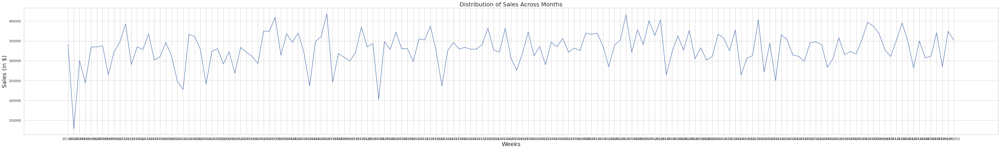

In [ ]:
###########Distribution of sales across weeks till 2013#
master_df1=master_df[master_df['Date']<='2013-12-31']
master_df1=master_df1[master_df1['Date']!='2011-01-02']
weekly_df=master_df1.groupby(['Week_no'])['total_amt'].sum().to_frame().reset_index().sort_values(by='Week_no')
weekly_df['Week_no']=weekly_df['Week_no'].astype(str)
fig, ax = plt.subplots()
fig.set_size_inches(60, 8)
plt.plot('Week_no','total_amt',data=weekly_df)
sns.set_style("dark")
plt.xlabel('Weeks',fontsize=20)
plt.ylabel('Sales (in $)',fontsize=20)
plt.title('Distribution of Sales Across Months',fontsize=20)

In [ ]:
weekly_df.head(60)

,Week_no,total_amt
0,201101,340779.790
1,201102,128524.760
2,201104,300546.740
3,201105,243907.755
4,201106,334799.530
5,201107,334748.700
6,201108,337970.880
7,201109,264679.545
8,201110,322288.720
9,201111,347151.220


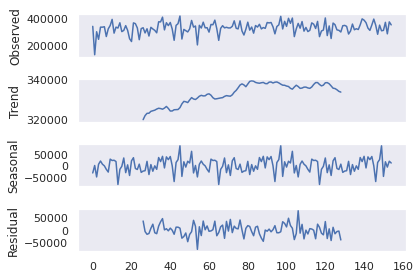

In [ ]:
##########Decomposing the time series into trend, seasonality and cycles
from random import randrange
from pandas import Series
from matplotlib import pyplot
from statsmodels.tsa.seasonal import seasonal_decompose
series = weekly_df['total_amt']
result = seasonal_decompose(series, model='additive', freq=52)
result.plot()
pyplot.show()

<b>We need to find the if the time series in stationary
We formulate an hypothesis and check for its stationarity for a significance level of 0.05 using dicky fuller test<br>
NULL: The sales data is not stationary<br>
Aternate: The sales data is stationary